In [1]:
%pylab inline
import os
import gc
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

print('Rum me on IDark')
datDir=os.path.join(os.environ['homeWrk'],'S16ACatalogs')

Populating the interactive namespace from numpy and matplotlib


ModuleNotFoundError: No module named 'haloSim'

In [21]:
cd wrkDir/sim

[Errno 2] No such file or directory: 'wrkDir/sim'
/lustre/work/xiangchong.li/work/massMapSparse/sim


In [25]:
iz  =   2
im  =   6
ver='pix48-ns10'
zer='zt' #pz/zt
ner='wn_23' #wn-1/nn
if 'wn_' in ner:
    isim=   eval(ner.split('_')[-1])
else:
    isim=0
ver2='nl10-pc'

hdir='planck-cosmo/pre-run/%s/' %ver
odir='planck-cosmo/pre-run/%s/%s/' %(ver,ver2)

if not os.path.isdir(hdir):
    os.mkdir(hdir)
if not os.path.isdir(odir):
    os.mkdir(odir)

outfname1   =  os.path.join(hdir,'pixes','pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname2   =  os.path.join(hdir,'pixes','pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname3   =  os.path.join(hdir,'pixStd.fits')

# configuration
configName  =   'planck-cosmo/config-pix48-%s.ini' %ver2.split('-')[0]
print('configuration: ',configName)
parser      =   ConfigParser()
parser.read(configName)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)

configuration:  planck-cosmo/config-pix48-nl10.ini


In [26]:
haloCat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
# Simulation
mm=(haloCat['iz']==iz)&(haloCat['im']==im)
hh=haloCat[mm]

z_h=hh['zh']
log_m=hh['log10_M200']
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
assert conc==hh['conc']

halo =   haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('redshift is %.2f' %z_h)
print('logM is %.2f, and M= %.2fe14' %(log_m,M_200/1e14))

# load simualtion
ngroup  =   100
noiTab=Table.read('HSC-obs/20200328/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits')
ng=int(len(noiTab)//ngroup)
datU=noiTab[isim*ng:(isim+1)*ng]
lensKer= halo.lensKernel(datU['ztrue'])
shearR=  halo.DeltaSigmaComplex(datU['raR']*3600.,datU['decR']*3600.)*lensKer
shearH=  halo.DeltaSigmaComplex(datU['raH']*3600.,datU['decH']*3600.)*lensKer
Sigma=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
datU['g1R']=shearR.real
datU['g2R']=shearR.imag
datU['g1H']=shearH.real
datU['g2H']=shearH.imag
datU['Sigma']=Sigma

redshift is 0.25
logM is 14.74, and M= 5.47e14


In [27]:
dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('concentration is: %s' %(halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))

# Pixelation
gridInfo    =   cartesianGrid3D(parser)

if not os.path.isfile(outfname1):
    print('preparing the pixelation file')
    g1name  =   'g1R'
    g2name  =   'g2R'
    raname  =   'raR'
    decname =   'decR'
    if zer=='zt':
        zname   =   'ztrue'
    elif zer=='pz':
        zname   =   'zbest'
    if 'nn' in ner:
        val=(datU[g1name])+(datU[g2name])*1j
    elif 'wn' in ner:
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
    
    out1=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val.real,ws=None)
    out2=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val.imag,ws=None)
    pyfits.writeto(outfname1,out1,overwrite=True)
    pyfits.writeto(outfname2,out2,overwrite=True)

## Noise variance
if not os.path.isfile(outfname3):
    print('preparing the noise std file')
    ngroup=100
    pixDatAll=np.zeros((ngroup,)+gridInfo.shape,dtype=np.complex128)
    for ig in range(ngroup):
        datV=noiTab[ig*ng:(ig+1)*ng]
        raname  =   'raR'
        decname =   'decR'
        zname   =   'zbest'
        g1Pix=gridInfo.pixelize_data(datV[raname],datV[decname],datV[zname],datV['g1n'])
        g2Pix=gridInfo.pixelize_data(datV[raname],datV[decname],datV[zname],datV['g2n'])
        pixDatAll[ig]=g1Pix+1j*g2Pix
        del datV,g1Pix,g2Pix
        gc.collect()
    pixSigmaErr=np.std(pixDatAll,axis=0)
    pyfits.writeto(outfname3,pixSigmaErr,overwrite=True)
print('lens grid center:',gridInfo.zlcgrid)

rs of the input halo is 0.981 pixels.
concentration is: 3.822392750119385
the average density contrast should be 4.806.
preparing the pixelation file
lens grid center: [0.0625 0.1075 0.1525 0.1975 0.2425 0.2875 0.3325 0.3775 0.4225 0.4675]


In [24]:
outfname4   =  'lensing_kernel_m14-%s-%s.fits' %(zer,ver.split('-')[1])
outfname4   =   os.path.join(odir,outfname4)
parser.set('prepare','lkfname',outfname4)
if 'm14' in outfname4:
    di=False
else:
    di=True
    
# lensing kernel
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    if zer=='pz':
        lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best,deltaIn=di)
    elif zer=='zt':
        lensKernel= gridInfo.lensing_kernel(deltaIn=di)
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
else:
    lensKernel=pyfits.getdata(outfname4)
if True:
    atomFname='planck-cosmo/prior/haloBasis-nl10-pix48-m146_152.fits'
    atoms=pyfits.getdata(atomFname)
    atoms=atoms.reshape(10,48*48)

In [8]:
# Reconstruction Init
lbd=1.5
lcd=1.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','lcd','%s' %lcd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','mu','2e-4')
if 'pc' in ver2:
    parser.set('lensZ','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lensZ','resolve_lim','0.4') #pix
    parser.set('lensZ','rs_base','0.12')    #Mpc/h
    parser.set('sparse','nframe','3' )

a=pyfits.getdata(outfname3)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)
print(sparse3D.mu)
print(sparse3D.lcd)

0.0002
1.0


# sparse analysis

In [9]:
%%time
sparse3D.lbd=0.
sparse3D.lcd=1.
sparse3D.nonNeg=False
sparse3D.clean_outcome()
sparse3D.optimized_gradient_descent(3000)
outfname1=os.path.join(odir,'alphaRW-%d-%d-%s-%s-lasso-lbd%02d-lcd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10,sparse3D.lcd*10))
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-lasso-lbd%02d-lcd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10,sparse3D.lcd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 3.04 s, sys: 30.3 ms, total: 3.07 s
Wall time: 3.07 s


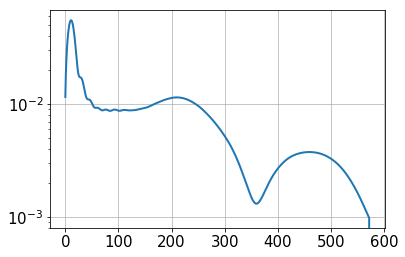

In [10]:
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

In [11]:
%%time
sparse3D.lbd=2.
sparse3D.lcd=0.
sparse3D.nonNeg=False
w   =   sparse3D.adaptive_lasso_weight(gamma=2.)
sparse3D.fista_gradient_descent(800,w=w)
outfname1=os.path.join(odir,'alphaRW-%d-%d-%s-%s-alasso-lbd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-alasso-lbd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 3.76 s, sys: 15.6 ms, total: 3.78 s
Wall time: 3.78 s


In [12]:
outfname2

'planck-cosmo/pre-run/pix48-ns10/nl10-pc/deltaR-2-6-pz-wn_23-alasso-lbd20.fits'

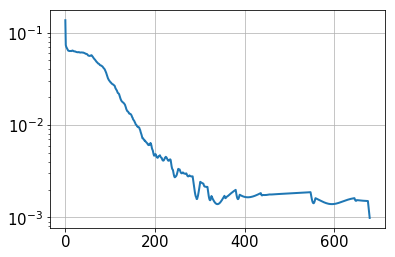

In [13]:
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

In [14]:
%%time
sparse3D.lbd=4.
sparse3D.lcd=0.
sparse3D.nonNeg=True
w   =   sparse3D.adaptive_lasso_weight(gamma=2.)
sparse3D.fista_gradient_descent(800,w=w)
outfname1=os.path.join(odir,'alphaRW-%d-%d-%s-%s-alasso2-lbd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
outfname1=os.path.join(odir,'alphaR-%d-%d-%s-%s-alasso2-lbd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10))
pyfits.writeto(outfname1,sparse3D.alphaR*sparse3D._w,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-alasso2-lbd%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 1.95 s, sys: 7.36 ms, total: 1.95 s
Wall time: 1.96 s


In [15]:
outfname2

'planck-cosmo/pre-run/pix48-ns10/nl10-pc/deltaR-2-6-pz-wn_23-alasso2-lbd40.fits'

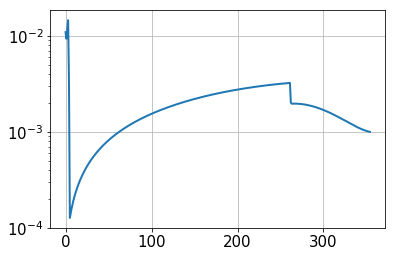

In [16]:
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

In [17]:
import detect3D
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(sparse3D.alphaR[:,0,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [18]:
src

iz,iy,ix,value
float64,float64,float64,float64
4.0,24.0,24.0,6.370424211995555


In [19]:
zc=sparse3D.zlBin[int(src['iz'])]
xc=gridInfo.xcgrid[int(src['ix'])]
yc=gridInfo.xcgrid[int(src['iy'])]
print(xc,yc,zc)

-1.6653345369377348e-16 -1.6653345369377348e-16 0.24249999999999997


$\texttt{D}^2\texttt{Map}$